## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Step1: Compute camera calibration matrix 

In [1]:
import numpy as np
import cv2
import glob
import math
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def camera_calibration():
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob('camera_cal/calibration*.jpg')

    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    return objpoints, imgpoints

objpoints, imgpoints = camera_calibration()

## Step2: Apply distortion correction to raw images

In [2]:
def undist_img(img, objpoints, imgpoints):
    #img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

#Test camera calibration
image = plt.imread('camera_cal/calibration1.jpg')
undistorted = undist_img(image, objpoints, imgpoints)



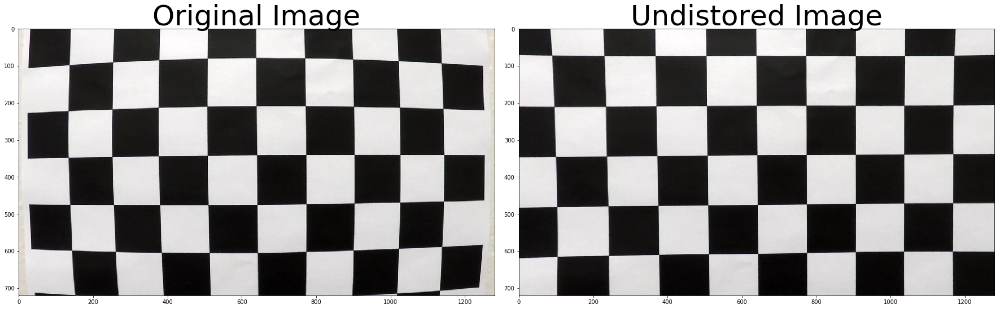

In [3]:
### Define function to help show image outputs ####
def show_test_images(og_img, ud_img, string1 = 'Original Image', string2 = 'Undistored Image', save_img=False, save_name = ''):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(og_img, cmap='gray')
    ax1.set_title(string1, fontsize=50)
    ax2.imshow(ud_img, cmap='gray')
    ax2.set_title(string2, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    if save_img is True:
        f.savefig('output_images/' + save_name)
#show_test_images(image, undistorted)

Undistored_image = show_test_images(image, undistorted, 'Original Image', 'Undistored Image', save_img=True, save_name='Undist')



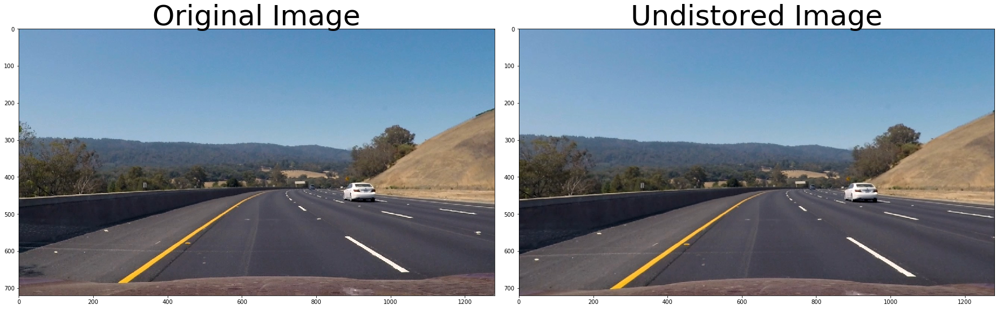

In [4]:
test_img = plt.imread('test_images/test3.jpg')
ud_img = undist_img(test_img, objpoints, imgpoints)

show_test_images(test_img, ud_img)

In [5]:
def region_of_interest(img):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    height_half = img.shape[0]/2
    width_half = img.shape[1]/2
    
    left_bottom = [0, img.shape[0]]
    left_top = [width_half*0.85, height_half*1.25]
    right_bottom = [img.shape[1], img.shape[0]]
    right_top = [width_half*1.15, height_half*1.25]
    
    vertices = np.array([[left_bottom],[left_top],[right_top],[right_bottom]], np.int32)
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, [vertices], ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    
    return masked_image




## Step 3: Create a Threshold Binary Image

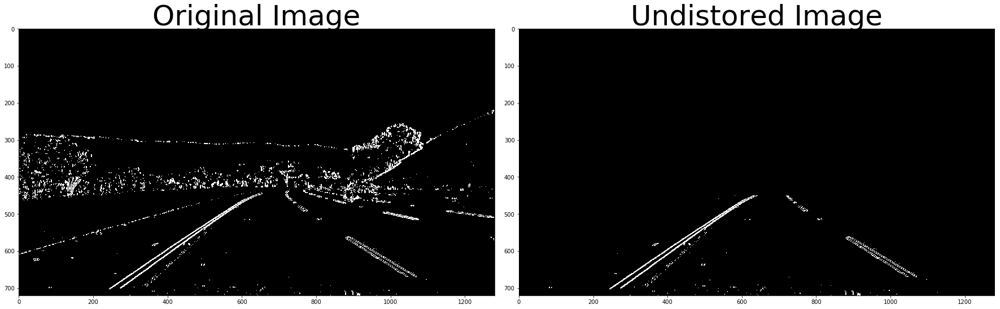

In [6]:
def abs_sobel_thresh(img, orient='x'):
    #Convert to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    if orient == 'x':
        thresh=(20,100)
        abs_sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5))
        #Scale to 8-bit (0 - 255) then convert to type = np.uint8
        scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
        #Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
        sxbin = np.zeros_like(scaled_sobelx)
        sxbin[(scaled_sobelx > thresh[0]) & (scaled_sobelx < thresh[1])] = 1
        sobel_output = sxbin
    elif orient == 'y':
        thresh=(40,100)
        abs_sobely = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
        #Scale to 8-bit (0 - 255) then convert to type = np.uint8
        scaled_sobely = np.uint8(255*abs_sobely/np.max(abs_sobely))
        #Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
        sybin = np.zeros_like(scaled_sobely)
        sybin[(scaled_sobely > thresh[0]) & (scaled_sobely < thresh[1])] = 1
        sobel_output = sybin
    
    return sobel_output

xgrad_img = abs_sobel_thresh(ud_img, orient='x')
roi_img = region_of_interest(xgrad_img)
show_test_images(xgrad_img, roi_img)                                 

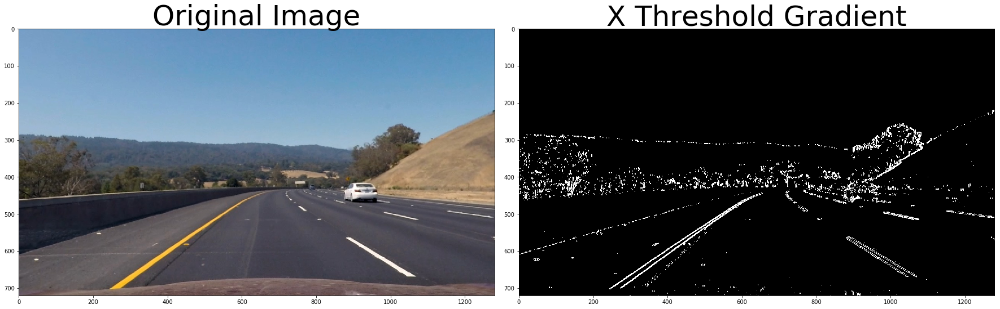

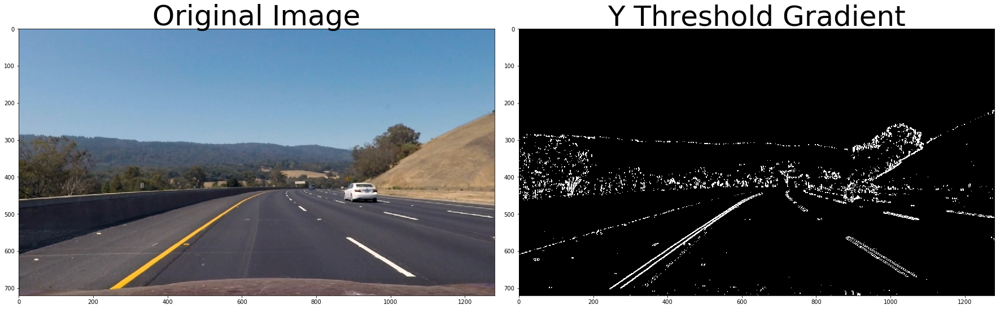

In [7]:
xgrad_img = abs_sobel_thresh(ud_img, orient='x')
ygrad_img = abs_sobel_thresh(ud_img, orient='y')
#show_test_images(ud_img, xgrad_img, string1='Undistorted Image', string2='X Threshold Gradient')
#show_test_images(ud_img, ygrad_img, string1='Undistorted Image', string2='Y Threshold Gradient')
show_test_images(ud_img, xgrad_img, 'Original Image', 'X Threshold Gradient', save_img=True, save_name='X_thresh_grad')
show_test_images(ud_img, xgrad_img, 'Original Image', 'Y Threshold Gradient', save_img=True, save_name='Y_thresh_grad')


In [8]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0,255)):
    #Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    #Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    #Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    #Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    #scaled_mag= np.uint8(255*gradmag/np.max(gradmag))
    #Create a binary mask where mag thresholds are met
    mag_bin = np.zeros_like(gradmag)
    mag_bin[(gradmag > mag_thresh[0]) & (gradmag < mag_thresh[1])] = 1
    #Return this mask as binary_output image 
    return mag_bin

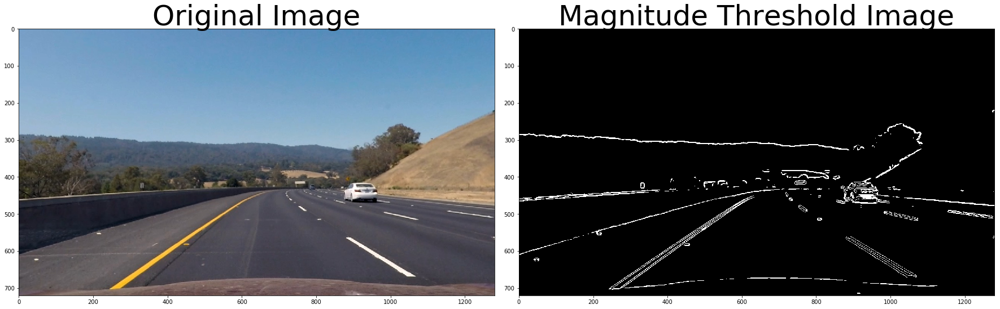

In [9]:
mag_img = mag_thresh(ud_img, sobel_kernel=15, mag_thresh=(60,120))
#show_test_images(ud_img, mag_img, string1='Undistorted Image', string2='Magnitude Threshold Image')
show_test_images(ud_img, mag_img, 'Original Image', 'Magnitude Threshold Image', save_img=True, save_name='Mag_img')


In [10]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    sobel_direc = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    direc_bin = np.zeros_like(sobel_direc)
    direc_bin[(sobel_direc > thresh[0]) & (sobel_direc < thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return direc_bin

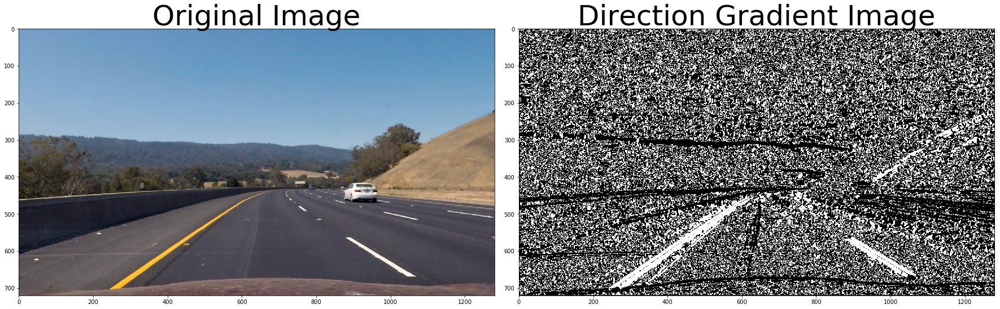

In [11]:
dir_img = dir_threshold(ud_img, sobel_kernel=15, thresh=(0.6,1.2))
#show_test_images(ud_img, dir_img, string1='Undistorted Image', string2='Direction Gradient Image')
show_test_images(ud_img, dir_img, 'Original Image', 'Direction Gradient Image', save_img=True, save_name='dir_img')



In [12]:
def hls_select(img, channel='s', thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    if channel == 'h':
        h_channel = hls[:,:,0]
        binary_output = np.zeros_like(h_channel)
        binary_output[(h_channel > thresh[0]) & (h_channel <= thresh[1])] = 1
    elif channel == 'l':
        l_channel = hls[:,:,1]
        binary_output = np.zeros_like(l_channel)
        binary_output[(l_channel > thresh[0]) & (l_channel <= thresh[1])] = 1
    elif channel == 's':
        s_channel = hls[:,:,2]
        binary_output = np.zeros_like(s_channel)
        binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    
    return binary_output

In [13]:
def r_colorspace(img, thresh=(200,255)):
    r_img = img[:,:,0]
    binary_output = np.zeros_like(r_img)
    binary_output[(r_img>thresh[0])& (r_img<thresh[1])]=1
    
    return binary_output

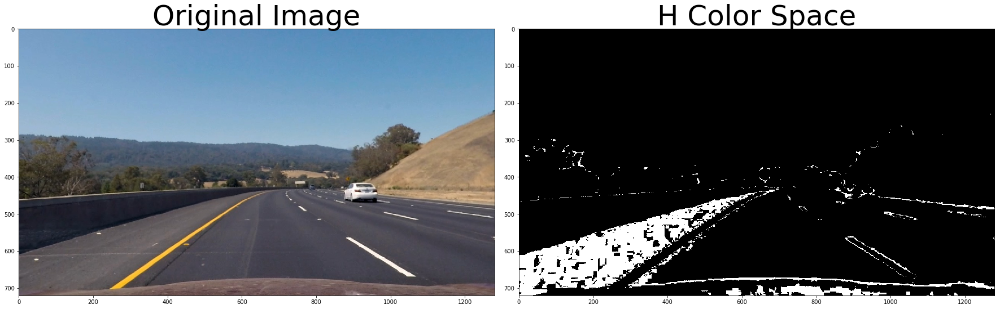

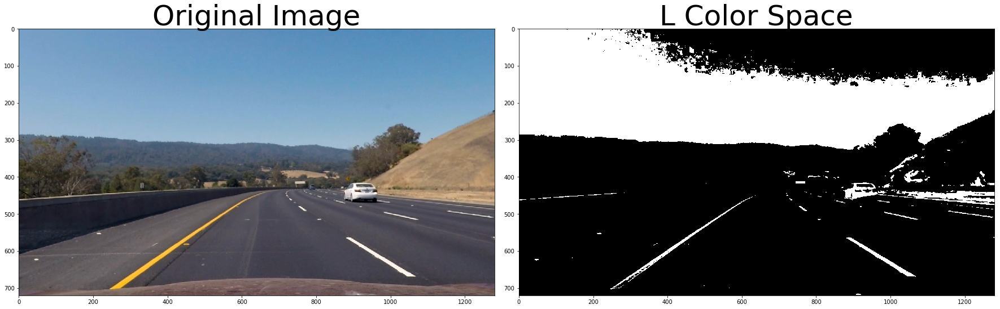

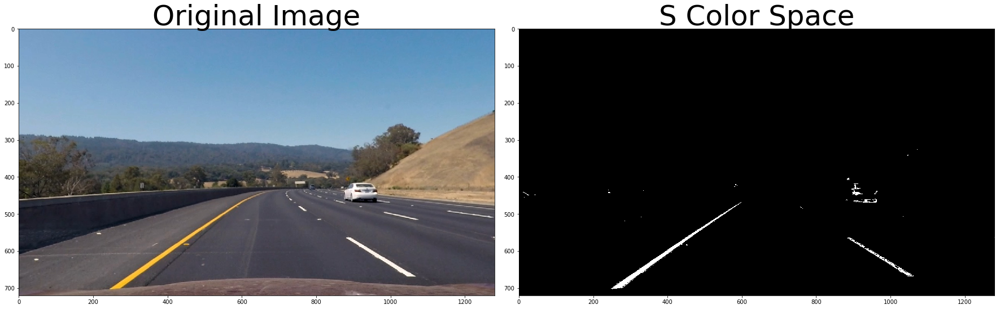

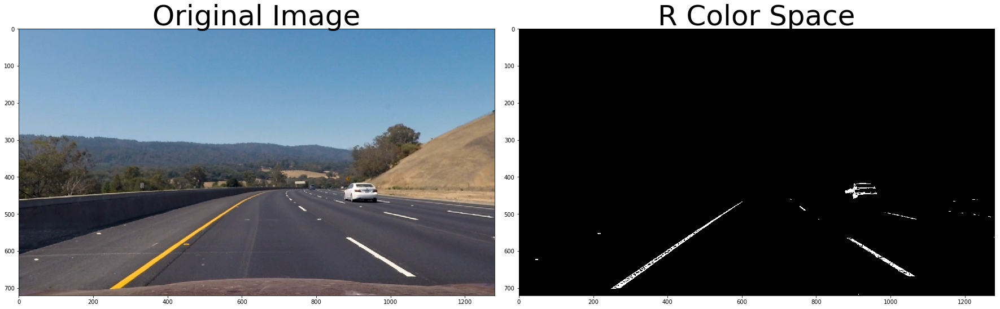

In [14]:
S_img = hls_select(ud_img, channel = 's', thresh=(155,255))
H_img = hls_select(ud_img, channel = 'h', thresh=(150,255))
L_img = hls_select(ud_img, channel = 'l', thresh=(150,255))
R_img = r_colorspace(ud_img, thresh=(220,255))
#show_test_images(ud_img, S1_img, string1='Undistorted Image', string2='S Channel Image')
#show_test_images(S1_img, S2_img, 'S1', 'S2')
#show_test_images(ud_img, R_ColorSpace_img, string1='Undistorted Image', string2='R Color Space Image')
show_test_images(ud_img, H_img, 'Original Image', 'H Color Space', save_img=True, save_name='H_Color_img')
show_test_images(ud_img, L_img, 'Original Image', 'L Color Space', save_img=True, save_name='L_Color_img')
show_test_images(ud_img, S_img, 'Original Image', 'S Color Space', save_img=True, save_name='S_Color_img')
show_test_images(ud_img, R_img, 'Original Image', 'R Color Space', save_img=True, save_name='R_Color_img')

## Step3.1: Combine Color and Gradient Thresholding

In [15]:
def combined_threshold(img):
    #combining thresholds of sobel_x, S channel, 
    sobel_x = abs_sobel_thresh(img, orient='x')
    sobel_y = abs_sobel_thresh(img, orient='y')
    s_color = hls_select(img, channel='s',thresh=(120,255))
    R_color= r_colorspace(ud_img, thresh=(220,255))

    combined_bin = np.zeros_like(sobel_x)
    combined_bin[((sobel_x==1) & (s_color==1))| (R_color==1)]=1
    #combined_bin[(sobel_x==1) | ((s_color==1) & (R_color==1))]=1
    #combined_bin[((sobel_x==1) & (sobel_y ==1))| ((s_color==1)& (R_color==1))]=1
    #stack each channel for visual of each binary
    color_bin = np.dstack((np.zeros_like(sobel_x), sobel_x, s_color)) * 255
    
    return combined_bin

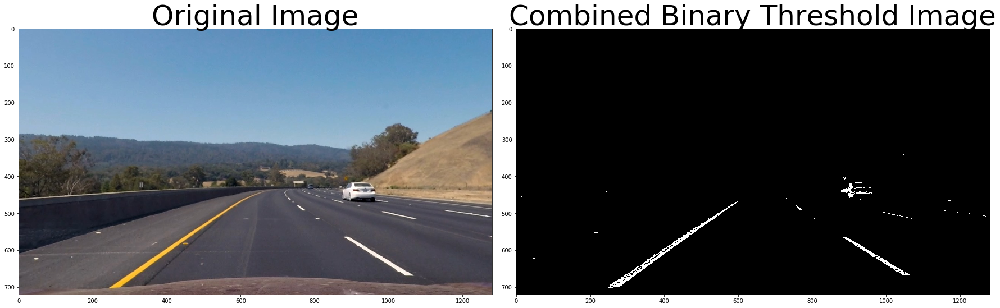

In [16]:
comb_img = combined_threshold(ud_img)
roi_img = region_of_interest(comb_img)
#show_test_images(ud_img, comb_img)
show_test_images(ud_img, comb_img, 'Original Image', 'Combined Binary Threshold Image', save_img=True, save_name='Threshold')


## Step4: Apply Perspective Transform

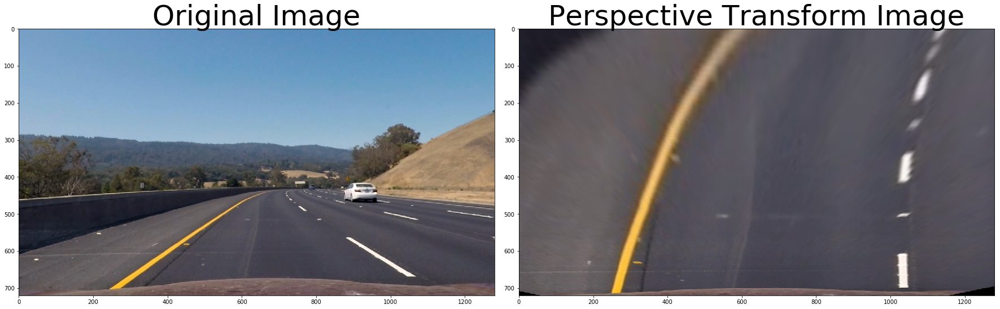

In [17]:
def bird_eye_transform(img, orient='M'):
    
    img_size = (img.shape[1], img.shape[0])
    
    #used for OG
    
    src_points = np.float32(
    [[280,  720],
     [590,  450],
     [700,  450],
     [1100, 720]])
    
    dst_points = np.float32(
    [[300,   720],
     [300,     0],
     [1000,    0],
     [1000,  720]])   
    """
    #used for 2
    
    src_points = np.float32(
    [[280,  720],
     [595,  450],
     [725,  450],
     [1125, 720]])

    dst_points = np.float32(
    [[250,   720],
     [250,     0],
     [1000,    0],
     [1000,  720]])
    """
    #used for 3
    """
    src_points = np.float32(
    [[250,  700],
     [420,  460],
     [860,  460],
     [1030, 700]])
    
    dst_points = np.float32(
    [[240,   720],
     [240,     0],
     [1000,    0],
     [1000,  720]])
    """
    M = cv2.getPerspectiveTransform(src_points, dst_points)
    M_inv = cv2.getPerspectiveTransform(dst_points, src_points)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    if orient == 'M_inv':
        warped = cv2.warpPerspective(img, M_inv, img_size, flags=cv2.INTER_LINEAR)
    
    #return warped, M, M_inv
    return warped

#bird_img, perspective_M, perspective_M_inv = bird_eye_transform(ud_img, orient='M')
bird_img = bird_eye_transform(ud_img, orient='M')
#show_test_images(ud_img, bird_img, string1='Orignial Image', string2='Birds Eye Image')
show_test_images(ud_img, bird_img, 'Original Image', 'Perspective Transform Image', save_img=True, save_name='Bird_img')


## Step5: Detect Lane Pixels to Find the Lane Boundry

In [18]:
comb_img = combined_threshold(ud_img)
roi_img = region_of_interest(comb_img)
bird_bin_img = bird_eye_transform(roi_img)
#show_test_images(thresh_og_img, bird_img, string1='OG Threshold Image', string2='Warped Threshold Image')
#show_test_images(comb_img, roi_img, 'Binary Threshold Image', 'Region of Interest Image', save_img=True, save_name='Roi_img')
#show_test_images(bird_img, bird_bin_img, 'Perspective Transform Image', 'Perspective Transform Binary Image', save_img=True, save_name='bin_bird')



In [19]:
def find_histogram(warped_img):
    histogram = np.sum(warped_img[warped_img.shape[0]//2:,:], axis=0)
    
    return histogram



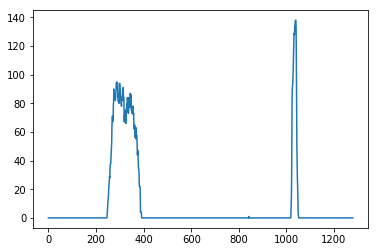

In [20]:
histogram = plt.plot(find_histogram(bird_bin_img))
plt.savefig('output_images/histogram')


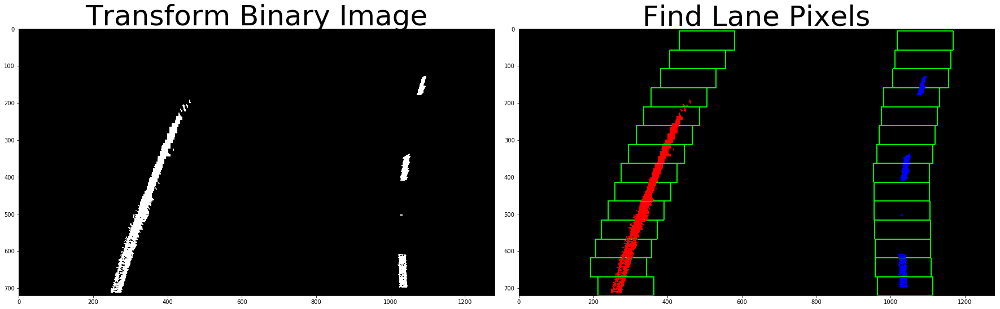

In [21]:
def find_lane_pixels(binary_warped, show_img=False):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        
    nwindows = 14
    # Set the width of the windows +/- margin
    margin = 150
    # Set minimum number of pixels found to recenter window
    minpix = 100
    
    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    left_x_coords = []
    right_x_coords =[]
    count = -1
    count_left = -1
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin//2  # Update this
        win_xleft_high = leftx_current + margin//2 # Update this
        win_xright_low = rightx_current - margin//2  # Update this
        win_xright_high = rightx_current + margin//2  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        #Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzerox > win_xleft_low) & (nonzerox < win_xleft_high) 
        & (nonzeroy > win_y_low) & (nonzeroy < win_y_high)).nonzero()[0]
        good_right_inds = ((nonzerox > win_xright_low) & (nonzerox < win_xright_high) 
        & (nonzeroy > win_y_low) & (nonzeroy < win_y_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        #If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        #### else if need to follow along the slow of the previous x position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            left_x_coords.append(leftx_current)
            count_left +=1
        elif(count_left > 0 and len(left_x_coords) > 1):
            if left_x_coords[count_left] != left_x_coords[count_left-1]:
                left_slope = (win_y_high - (win_y_high - window_height))//(left_x_coords[count_left] - left_x_coords[count_left-1])
                b_int_left = (win_y_high-window_height) - left_slope*left_x_coords[count_left]
                leftx_current = (win_y_high-b_int_left)//left_slope
                left_x_coords.append(leftx_current)
                count_left +=1
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            right_x_coords.append(rightx_current)
            count +=1
        elif(count > 0 and len(right_x_coords)> 1):
            if right_x_coords[count] != right_x_coords[count-1]:
                right_slope = (win_y_high - (win_y_high-window_height))//(right_x_coords[count]-right_x_coords[count-1])
                #print(right_slope)
                b_int_right = (win_y_high-window_height) - right_slope*right_x_coords[count]
                rightx_current = (win_y_high - b_int_right)//right_slope
            right_x_coords.append(rightx_current)
            count +=1
    
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    #Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # package line fits, left points, and right points into seperate lines
    poly_fits = (left_fit, right_fit)
    left_pixs = (leftx, lefty)
    right_pixs = (rightx, righty)
    
    if show_img == True:
        #for x in range(binary_warped.shape[0]):
            # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        left_pts = np.array(np.dstack((left_fitx, ploty)), np.int32)
        right_pts = np.array(np.dstack((right_fitx, ploty)), np.int32)
        #cv2.polylines(out_img, left_pts, False, (255,0,0), 5)
        #cv2.polylines(out_img, right_pts, False, (255,0,0), 5)
        #print('left_pts = ')
        #print(left_pts)
        
        return poly_fits, out_img
    
    return poly_fits
poly_fits, out_img = find_lane_pixels(bird_bin_img, show_img=True)

show_test_images(bird_bin_img, out_img, 'Transform Binary Image', 'Find Lane Pixels', save_img=True, save_name='Find_lane_img')


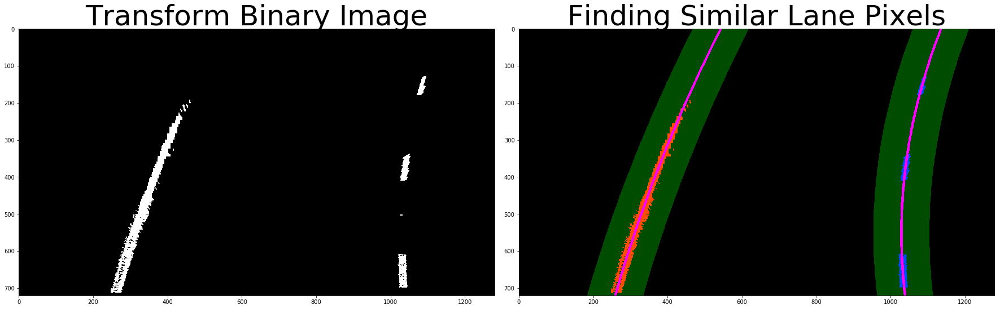

In [22]:
def search_around_poly(binary_warped, poly_fits=None, show_img=False):
    #Determine if there are previous polyfit lines:
    if poly_fits is None:
        print('finding pixels again')
        return find_lane_pixels(binary_warped)

    left_fit = poly_fits[0]
    right_fit = poly_fits[1]

    margin = 75

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_lane_inds = ((nonzerox > left_fit[0]*nonzeroy**2 + left_fit[1]*nonzeroy + left_fit[2]-margin) 
    & (nonzerox < left_fit[0]*nonzeroy**2 + left_fit[1]*nonzeroy + left_fit[2] + margin))
    right_lane_inds = ((nonzerox > right_fit[0]*nonzeroy**2 + right_fit[1]*nonzeroy + right_fit[2] - margin)
    & (nonzerox < right_fit[0]*nonzeroy**2 + right_fit[1]*nonzeroy+right_fit[2]+margin))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit new polynomials
    try:
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
    except:
        print('empty values found. Performing search again')
        polyfit = find_lane_pixels(binary_warped, show_img=False)
        left_fit = poly_fits[0]
        right_fit = poly_fits[1]  
        
    ploty = np.linspace(0, binary_warped.shape[0] -1, binary_warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    #Package lines 
    poly_fits = (left_fit, right_fit)
    #left_pix = (leftx, lefty)
    #right_pix = (rightx, righty)
    left_line = (left_fitx, ploty)
    right_line = (right_fitx, ploty)
    # Plot the polynomial lines onto the image
    left_pts = np.array(np.dstack((left_fitx, ploty)), np.int32)
    right_pts = np.array(np.dstack((right_fitx, ploty)), np.int32)
    cv2.polylines(result_img, left_pts, False, (255,0,255), 5)
    cv2.polylines(result_img, right_pts, False, (255,0,255), 5)
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return poly_fits, left_line, right_line, result_img

lines_fit, left_line, right_line, out_img = search_around_poly(bird_bin_img, poly_fits)

show_test_images(bird_bin_img, out_img, 'Transform Binary Image', 'Finding Similar Lane Pixels', save_img=True, save_name='Search_around_img')


## Step6: Find the Curvature of the Lanes



In [23]:
def measure_curvature_pixels(left_line_ind, right_line_ind):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    leftx = left_line_ind[0]
    rightx = right_line_ind[0]
    ploty = right_line_ind[1]
    
    y_eval = np.max(ploty)
    
    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y
    
    left_fit_curve = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix,2)
    right_fit_curve = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix,2)

    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_curve[0]*y_eval*ym_per_pix + left_fit_curve[1])**2)**1.5) / np.absolute(2*left_fit_curve[0])
    right_curverad = ((1 + (2*right_fit_curve[0]*y_eval*ym_per_pix + right_fit_curve[1])**2)**1.5) / np.absolute(2*right_fit_curve[0])
    
    left_curverad = math.ceil(left_curverad/100)*100
    right_curverad = math.ceil(right_curverad/100)*100
    
    laneCurve = (left_curverad+right_curverad)/2
    roundCurve = math.ceil(laneCurve/100)*100
    if roundCurve > 10000:
        roundCurve = 10000
        
    return roundCurve

curvature = measure_curvature_pixels(left_line, right_line)
print(curvature)

800


In [24]:
def find_dist_lane(img, left_line_ind, right_line_ind):
    
    leftx = left_line_ind[0]
    rightx = right_line_ind[0]
    y = right_line_ind[1]
    
    leftx_pts = np.flipud(np.transpose(np.vstack([leftx,y])))
    rightx_pts = np.flipud(np.transpose(((np.vstack([rightx, y])))))
    
    ym_per_pix = 30/720
    xm_per_pix = 3.7/700
    
    f_leftx, f_lefty = leftx_pts[0]
    f_rightx, f_righty = rightx_pts[0]
    
    mid_img = img.shape[1]//2
    car_pos = (f_leftx+f_rightx)/2
    
    distToCent = round(((mid_img - car_pos)*xm_per_pix),2)

    
    return distToCent

distance = find_dist_lane(bird_img, left_line, right_line)
print(distance)


-0.05


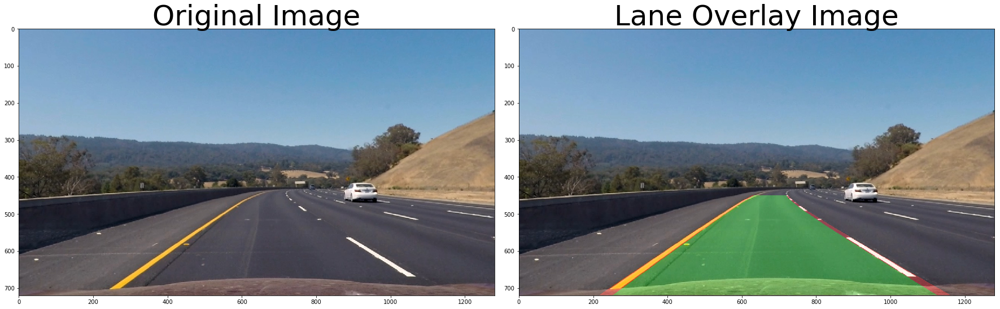

In [25]:
#def OG_PolyPoints(img, perspective_img, left_fitx, right_fitx, ploty, M_inv):   
def OG_PolyPoints(img, perspective_img, left_line_ind, right_line_ind):    
    #need to transpose and vstack since points go from top to bottom
    left_pts = np.array([np.transpose(np.vstack([left_line_ind]))]).astype(np.int32)
    #need to transpose, vstack and flip updown since right bottom to top
    right_pts = np.array([np.flipud(np.transpose(np.vstack([right_line_ind])))]).astype(np.int32)
    all_pts = np.hstack((left_pts, right_pts))
    
    overlay = np.zeros_like(perspective_img, dtype=np.uint8)
    color_overlay = np.dstack((overlay, overlay, overlay))
    
    cv2.fillPoly(color_overlay, np.int_([all_pts]), (0,255,0))
    cv2.polylines(color_overlay, left_pts, isClosed=False, color=(255,0,0), thickness=30)
    cv2.polylines(color_overlay, right_pts, isClosed=False, color=(255,0,0), thickness=30)  
    
    #unwarped_overlay = cv2.warpPerspective(color_overlay, M_inv, (img.shape[1], img.shape[0]))
    unwarped_overlay = bird_eye_transform(color_overlay, orient='M_inv')
    OG_overlay_img = cv2.addWeighted(img, 1, unwarped_overlay, 0.3, 0)
    
    return OG_overlay_img

image_lane = OG_PolyPoints(ud_img, bird_bin_img, left_line, right_line)

#show_test_images(ud_img, image_lane, 'OG Image', 'Overlay Image')
show_test_images(ud_img, image_lane, 'Original Image', 'Lane Overlay Image', save_img=True, save_name='Overlay_img')
    

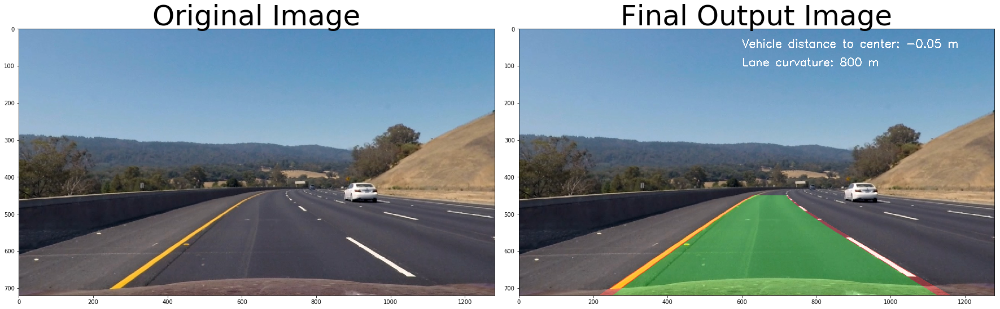

In [26]:
def TextInfo(img, dist, curvature): 
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = "Vehicle distance to center: {} m".format(dist)
    cv2.putText(img,text, (600,50), font, 1, (255,255,255), 2)
    text2 = "Lane curvature: {} m ".format(int(curvature))
    cv2.putText(img,text2, (600,100), font, 1, (255,255,255), 2)
    return img

text_img = TextInfo(image_lane, distance, curvature)
#show_test_images(ud_img, text_img)  
show_test_images(ud_img, text_img, 'Original Image', 'Final Output Image', save_img=True, save_name='Final_img')
first_image = cv2.imwrite('output_images/text_img.png', text_img)

In [27]:
def Pipeline(img):
    
    objpoints, imgpoints = camera_calibration()
    
    undist = undist_img(img, objpoints, imgpoints)
    
    x_sobel = abs_sobel_thresh(undist, orient='x')
    
    combined_bin = combined_threshold(undist)
    
    roi_img = region_of_interest(combined_bin)
    
    persp_img = bird_eye_transform(roi_img, orient='M')
    
    #leftx, lefty, rightx, righty, out_img = find_lane_pixels(persp_img)
    
    #poly_img, left_fit, left_fitx, right_fit, right_fitx, ploty = fit_polynomial(persp_img, leftx, lefty, rightx, righty)
    
    lines_fit, left_line, right_line, out_img = search_around_poly(persp_img, poly_fits)
    
    curvature = measure_curvature_pixels(left_line, right_line)
    
    distance = find_dist_lane(persp_img, left_line, right_line)
    
    #OG_Poly_img = OG_PolyPoints(undist, persp_img, left_fitx, right_fitx, ploty, perspective_M_inv)
    image_lane = OG_PolyPoints(undist, persp_img, left_line, right_line)
    
    final_img = TextInfo(image_lane, distance, curvature)
    return final_img
        

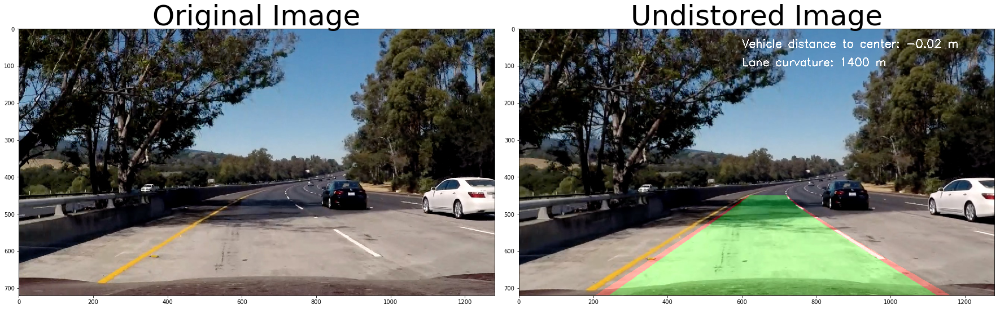

In [28]:
### testing on image first
image1 = plt.imread('test_images/test5.jpg')
process_image = Pipeline(image1)

show_test_images(image1, process_image)

In [29]:
# Defining a class to make camera calibration seperate from the image processing pipeline
class Pipeline: 
    #Calibrate camera when creating new object
    def __init__(self):
        self.objpoints, self.imgpoints = camera_calibration()
    """ use call function to be able to call the class as a function, this allows the camera calibration to only happen
        at the creation of a new object and not every iteration of the image process pipeline. """
    def __call__(self, img):
        undist = undist_img(img, objpoints, imgpoints)

        x_sobel = abs_sobel_thresh(undist, orient='x')

        combined_bin = combined_threshold(undist)

        roi_img = region_of_interest(combined_bin)

        persp_img = bird_eye_transform(roi_img, orient='M')

        lines_fit, left_line, right_line, out_img = search_around_poly(persp_img, poly_fits)

        curvature = measure_curvature_pixels(left_line, right_line)

        distance = find_dist_lane(persp_img, left_line, right_line)

        image_lane = OG_PolyPoints(undist, persp_img, left_line, right_line)

        final_img = TextInfo(image_lane, distance, curvature)

        return final_img
        

In [30]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
white_output = 'project_video_solution_NewComb.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
pipeline_image = Pipeline()
clip1 = VideoFileClip("project_video.mp4").subclip(39,42)
#clip1 = VideoFileClip('project_video.mp4')
white_clip = clip1.fl_image(pipeline_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video project_video_solution_NewComb.mp4
[MoviePy] Writing video project_video_solution_NewComb.mp4


 99%|█████████▊| 75/76 [01:40<00:01,  1.39s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_solution_NewComb.mp4 

CPU times: user 1min 34s, sys: 252 ms, total: 1min 34s
Wall time: 1min 44s
